# Network analysis on global trade data

## Deng et al. (2021)
### Social network analysis of virtual water trade among major countries in the world

In [249]:
import math
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

from collections import Counter 
import numpy as np
from operator import itemgetter
import powerlaw as pwl

from networkx.algorithms import community

# Data prep

### Visit the following website and download the bilateral trade data: https://www.fao.org/faostat/en/#data  
    - Trade > Detailed trade matrix    
    
### Find dataset for the node  
    - Population and Employment  
    - Macro Indicators  
    - SDG Indictors
    
    
### Navigate the metadata and other resources

### Load the trade data

In [253]:
link = pd.read_csv("D:/Trade_DetailedTradeMatrix_E_All_Data_(Normalized).csv")

In [254]:
# inspect the data
link.head()

,Reporter Country Code,Reporter Country Code (M49),Reporter Countries,Partner Country Code,Partner Country Code (M49),Partner Countries,Item Code,Item Code (CPC),Item,Element Code,Element,Year Code,Year,Unit,Value,Flag
0,2,'004,Afghanistan,9,'032,Argentina,341,'21910.90,"Cake, oilseeds nes",5610,Import quantity,2017,2017,t,463.11,A
1,2,'004,Afghanistan,9,'032,Argentina,341,'21910.90,"Cake, oilseeds nes",5610,Import quantity,2019,2019,t,1192.62,A
2,3,'008,Albania,3,'008,Albania,828,'25020.01,Cigarettes,5610,Import quantity,2004,2004,t,12.00,A
3,4,'012,Algeria,2,'004,Afghanistan,231,'21422,"Almonds, shelled",5610,Import quantity,2005,2005,t,3.00,A
4,3,'008,Albania,3,'008,Albania,828,'25020.01,Cigarettes,5622,Import value,2004,2004,1000 USD,104.00,A


### Create an edge list

#### The final data format: O_code | D_code | O_name | D_name | year | item | weight (traded volume)

In [256]:
# select variables
link = link[['Reporter Country Code', 'Reporter Countries', 'Partner Country Code', 'Partner Countries', 'Item', 'Element', 'Year', 'Unit', 'Value']]

In [257]:
# filter down.. export quantity only.. select items... Remove 0 values
link1 = link[(link["Value"]>0) & ((link["Element"]) == ("Export quantity")) & ((link["Item"])== ("Soya beans"))]
link1

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Item,Element,Year,Unit,Value
26328,105,Israel,3,Albania,Soya beans,Export quantity,2017,t,10.91
35091,226,Uganda,4,Algeria,Soya beans,Export quantity,2015,t,74.97
63906,21,Brazil,2,Afghanistan,Soya beans,Export quantity,2020,t,4044.68
80830,230,Ukraine,2,Afghanistan,Soya beans,Export quantity,2015,t,202.55
86125,214,"China, Taiwan Province of",7,Angola,Soya beans,Export quantity,2013,t,1.00
...,...,...,...,...,...,...,...,...,...
50389610,150,Netherlands (Kingdom of the),231,United States of America,Soya beans,Export quantity,2016,t,7.94
50389611,150,Netherlands (Kingdom of the),231,United States of America,Soya beans,Export quantity,2018,t,0.53
50389612,150,Netherlands (Kingdom of the),231,United States of America,Soya beans,Export quantity,2020,t,0.10
50389613,150,Netherlands (Kingdom of the),231,United States of America,Soya beans,Export quantity,2022,t,12.00


In [258]:
link1["Value"].sort_values(ascending = True)

50399602           0.01
39065438           0.01
39065466           0.01
39069717           0.01
39250367           0.01
               ...     
17755507    57963485.74
17755697    60476103.96
17755604    60595839.60
17755414    68839892.47
17755887    74471954.17
Name: Value, Length: 27219, dtype: float64

In [259]:
link2 = link[(link["Value"]>0) & ((link["Element"]) == ("Import quantity")) & ((link["Item"])== ("Soya beans"))]
link2

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Item,Element,Year,Unit,Value
2368,26,Brunei Darussalam,2,Afghanistan,Soya beans,Import quantity,2020,t,2.05
9462,16,Bangladesh,9,Argentina,Soya beans,Import quantity,2005,t,61301.00
9604,16,Bangladesh,9,Argentina,Soya beans,Import quantity,2006,t,119327.00
9739,16,Bangladesh,9,Argentina,Soya beans,Import quantity,2007,t,140340.00
9883,16,Bangladesh,9,Argentina,Soya beans,Import quantity,2015,t,160032.88
...,...,...,...,...,...,...,...,...,...
50416522,150,Netherlands (Kingdom of the),237,Viet Nam,Soya beans,Import quantity,2016,t,0.23
50416523,150,Netherlands (Kingdom of the),237,Viet Nam,Soya beans,Import quantity,2017,t,0.14
50416524,150,Netherlands (Kingdom of the),237,Viet Nam,Soya beans,Import quantity,2021,t,64.77
50416525,150,Netherlands (Kingdom of the),237,Viet Nam,Soya beans,Import quantity,2022,t,155.42


In [260]:
link2["Value"].sort_values(ascending = True)

3818085            0.01
24907065           0.01
33849650           0.01
47541291           0.01
36009621           0.01
               ...     
11827980    57676480.00
11828220    58146822.01
11828100    64277600.00
11827860    66084250.00
11828460    71592496.82
Name: Value, Length: 29183, dtype: float64

In [486]:
link3 = link[(link["Value"]>0) & ((link["Element"]) == ("Export quantity")) & ((link["Item"])== ("beef and veal preparations nes"))]
link3

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Item,Element,Year,Unit,Value
20,9,Argentina,2,Afghanistan,beef and veal preparations nes,Export quantity,1998,t,25.00
22,9,Argentina,2,Afghanistan,beef and veal preparations nes,Export quantity,2007,t,35.00
35,9,Argentina,2,Afghanistan,beef and veal preparations nes,Export quantity,2008,t,47.00
37,9,Argentina,2,Afghanistan,beef and veal preparations nes,Export quantity,2009,t,88.00
52,9,Argentina,2,Afghanistan,beef and veal preparations nes,Export quantity,2010,t,23.00
...,...,...,...,...,...,...,...,...,...
50418329,150,Netherlands (Kingdom of the),249,Yemen,beef and veal preparations nes,Export quantity,2021,t,18.86
50418330,150,Netherlands (Kingdom of the),249,Yemen,beef and veal preparations nes,Export quantity,2022,t,16.94
50418331,150,Netherlands (Kingdom of the),249,Yemen,beef and veal preparations nes,Export quantity,2023,t,34.79
50420919,150,Netherlands (Kingdom of the),248,Yugoslav SFR,beef and veal preparations nes,Export quantity,1991,t,34.00


In [489]:
link3["Value"].sort_values(ascending = True)

44174853        0.01
12336535        0.01
20054670        0.01
44579978        0.01
35201174        0.01
              ...   
38415652    60191.00
38821626    65221.00
38821598    66010.00
38415232    67481.00
40728195    80097.00
Name: Value, Length: 42187, dtype: float64

In [492]:
link4 = link[(link["Value"]>0) & ((link["Element"]) == ("Import quantity")) & ((link["Item"])== ("beef and veal preparations nes"))]
link4

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Item,Element,Year,Unit,Value
1521,47,Cook Islands,10,Australia,beef and veal preparations nes,Import quantity,1999,t,10.00
1583,47,Cook Islands,10,Australia,beef and veal preparations nes,Import quantity,2001,t,1.00
2925,90,Guinea,2,Afghanistan,beef and veal preparations nes,Import quantity,2016,t,4.27
3406,8,Antigua and Barbuda,9,Argentina,beef and veal preparations nes,Import quantity,2005,t,18.00
3646,86,Grenada,8,Antigua and Barbuda,beef and veal preparations nes,Import quantity,2002,t,16.00
...,...,...,...,...,...,...,...,...,...
50420909,150,Netherlands (Kingdom of the),248,Yugoslav SFR,beef and veal preparations nes,Import quantity,1987,t,18.00
50420910,150,Netherlands (Kingdom of the),248,Yugoslav SFR,beef and veal preparations nes,Import quantity,1989,t,12.00
50420911,150,Netherlands (Kingdom of the),248,Yugoslav SFR,beef and veal preparations nes,Import quantity,1990,t,14.00
50420912,150,Netherlands (Kingdom of the),248,Yugoslav SFR,beef and veal preparations nes,Import quantity,1991,t,2.00


In [493]:
link4["Value"].sort_values(ascending = True)

40116831        0.01
26903581        0.01
4451872         0.01
4447004         0.01
4404068         0.01
              ...   
18122062    65876.00
20540821    66699.00
20540906    67878.00
40646756    74945.00
40646778    77288.00
Name: Value, Length: 31974, dtype: float64

In [496]:
soybeans = pd.merge(
    link1,
    link2,
    on=["Reporter Country Code", "Reporter Countries", "Partner Country Code", "Partner Countries", "Year", "Item"],
    suffixes=("_x", "_y")
)

soybeans = soybeans[[
    "Reporter Country Code",
    "Reporter Countries",
    "Partner Country Code",
    "Partner Countries",
    "Year",
    "Value_x",  # Export
    "Value_y"   # Import
]]

soybeans["Item"] = "Soy beans"

soybeans["Final Value"] = soybeans[["Value_x", "Value_y"]].max(axis=1)

soybeans

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Year,Value_x,Value_y,Item,Final Value
0,18,Bhutan,100,India,2010,19.00,39.00,Soy beans,39.00
1,18,Bhutan,100,India,2012,1.00,1.00,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,2365.00,4.00,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,9298.05,80.00,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,22.17,0.96,Soy beans,22.17
...,...,...,...,...,...,...,...,...,...
8738,150,Netherlands (Kingdom of the),231,United States of America,2016,7.94,2058590.25,Soy beans,2058590.25
8739,150,Netherlands (Kingdom of the),231,United States of America,2018,0.53,3029938.01,Soy beans,3029938.01
8740,150,Netherlands (Kingdom of the),231,United States of America,2020,0.10,1582196.88,Soy beans,1582196.88
8741,150,Netherlands (Kingdom of the),231,United States of America,2022,12.00,1765343.12,Soy beans,1765343.12


In [500]:
beef = pd.merge(
    link3,
    link4,
    on=["Reporter Country Code", "Reporter Countries", "Partner Country Code", "Partner Countries", "Year", "Item"],
    suffixes=("_x", "_y")
)

beef = beef[[
    "Reporter Country Code",
    "Reporter Countries",
    "Partner Country Code",
    "Partner Countries",
    "Year",
    "Value_x",  # Export
    "Value_y",  # Import
]]

beef["Item"] = "Beef"

beef["Final Value"] = beef[["Value_x", "Value_y"]].max(axis=1)
beef

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Year,Value_x,Value_y,Item,Final Value
0,244,Samoa,10,Australia,2021,25.00,0.86,Beef,25.00
1,14,Barbados,8,Antigua and Barbuda,1992,4.00,13.00,Beef,13.00
2,168,Papua New Guinea,10,Australia,2020,0.10,3.86,Beef,3.86
3,168,Papua New Guinea,10,Australia,2021,0.01,154.71,Beef,154.71
4,154,North Macedonia,3,Albania,2017,2.33,0.03,Beef,2.33
...,...,...,...,...,...,...,...,...,...
10714,150,Netherlands (Kingdom of the),231,United States of America,1997,1.00,11.00,Beef,11.00
10715,150,Netherlands (Kingdom of the),231,United States of America,2021,3.43,0.19,Beef,3.43
10716,150,Netherlands (Kingdom of the),231,United States of America,2022,2.06,3.75,Beef,3.75
10717,150,Netherlands (Kingdom of the),234,Uruguay,2023,0.69,17.83,Beef,17.83


In [502]:
edge = pd.concat([soybeans, beef], ignore_index = True)
edge

,Reporter Country Code,Reporter Countries,Partner Country Code,Partner Countries,Year,Value_x,Value_y,Item,Final Value
0,18,Bhutan,100,India,2010,19.00,39.00,Soy beans,39.00
1,18,Bhutan,100,India,2012,1.00,1.00,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,2365.00,4.00,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,9298.05,80.00,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,22.17,0.96,Soy beans,22.17
...,...,...,...,...,...,...,...,...,...
19457,150,Netherlands (Kingdom of the),231,United States of America,1997,1.00,11.00,Beef,11.00
19458,150,Netherlands (Kingdom of the),231,United States of America,2021,3.43,0.19,Beef,3.43
19459,150,Netherlands (Kingdom of the),231,United States of America,2022,2.06,3.75,Beef,3.75
19460,150,Netherlands (Kingdom of the),234,Uruguay,2023,0.69,17.83,Beef,17.83


In [504]:
edge = edge.rename(columns={
    "Reporter Country Code" : "O_code",
    "Reporter Countries" : "O_name",
    "Partner Country Code": "D_code",
    "Partner Countries": "D_name",
    "Year": "year",
    "Item": "item",
    "Final Value": "weight"
})[["O_code", "O_name", "D_code", "D_name", "year", "item", "weight"]]

In [506]:
edge

,O_code,O_name,D_code,D_name,year,item,weight
0,18,Bhutan,100,India,2010,Soy beans,39.00
1,18,Bhutan,100,India,2012,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,Soy beans,22.17
...,...,...,...,...,...,...,...
19457,150,Netherlands (Kingdom of the),231,United States of America,1997,Beef,11.00
19458,150,Netherlands (Kingdom of the),231,United States of America,2021,Beef,3.43
19459,150,Netherlands (Kingdom of the),231,United States of America,2022,Beef,3.75
19460,150,Netherlands (Kingdom of the),234,Uruguay,2023,Beef,17.83


In [508]:
# save the result
edge.to_csv("edge.csv")

### Create a node data combining multiple sources

#### The final data format: country | country_code | continent | population | var1 | var2 | var3...

In [272]:
# load datasets
macro = pd.read_csv("D:/Macro-Statistics_Key_Indicators_E_All_Data_(Normalized).csv", encoding_errors = 'ignore')
pop= pd.read_csv("D:/Population_E_All_Data_(Normalized).csv", encoding_errors = 'ignore')

In [273]:
macro = macro[["Area Code", "Area", "Item", "Element", "Year", "Unit", "Value"]]

In [274]:
macro

,Area Code,Area,Item,Element,Year,Unit,Value
0,2,Afghanistan,Gross Domestic Product,Value Standard Local Currency,1970,million SLC,78.697146
1,2,Afghanistan,Gross Domestic Product,Value Standard Local Currency,1971,million SLC,82.397024
2,2,Afghanistan,Gross Domestic Product,Value Standard Local Currency,1972,million SLC,71.797487
3,2,Afghanistan,Gross Domestic Product,Value Standard Local Currency,1973,million SLC,77.997271
4,2,Afghanistan,Gross Domestic Product,Value Standard Local Currency,1974,million SLC,96.996607
...,...,...,...,...,...,...,...
704309,5817,Net Food Importing Developing Countries,Gross National Income,Annual growth US$ per capita,2018,%,-0.935393
704310,5817,Net Food Importing Developing Countries,Gross National Income,Annual growth US$ per capita,2019,%,-1.205496
704311,5817,Net Food Importing Developing Countries,Gross National Income,Annual growth US$ per capita,2020,%,-2.433519
704312,5817,Net Food Importing Developing Countries,Gross National Income,Annual growth US$ per capita,2021,%,9.098567


In [275]:
pop = pop[["Area Code", "Area", "Item", "Element", "Year", "Unit", "Value"]]

In [276]:
pop

,Area Code,Area,Item,Element,Year,Unit,Value
0,2,Afghanistan,Population - Est. & Proj.,Total Population - Both sexes,1950,1000 No,7776.176
1,2,Afghanistan,Population - Est. & Proj.,Total Population - Both sexes,1951,1000 No,7879.339
2,2,Afghanistan,Population - Est. & Proj.,Total Population - Both sexes,1952,1000 No,7987.783
3,2,Afghanistan,Population - Est. & Proj.,Total Population - Both sexes,1953,1000 No,8096.698
4,2,Afghanistan,Population - Est. & Proj.,Total Population - Both sexes,1954,1000 No,8207.950
...,...,...,...,...,...,...,...
168684,5817,Net Food Importing Developing Countries,Population - Est. & Proj.,Urban population,2046,1000 No,1383146.702
168685,5817,Net Food Importing Developing Countries,Population - Est. & Proj.,Urban population,2047,1000 No,1417990.918
168686,5817,Net Food Importing Developing Countries,Population - Est. & Proj.,Urban population,2048,1000 No,1453215.998
168687,5817,Net Food Importing Developing Countries,Population - Est. & Proj.,Urban population,2049,1000 No,1488809.964


In [277]:
# merge them

In [278]:
macro["Element"].unique()

array(['Value Standard Local Currency', 'Value US$',
       'Value US$ per capita',
       'Value Standard Local Currency, 2015 prices',
       'Value US$ per capita, 2015 prices', 'Value US$, 2015 prices',
       'Annual growth Standard Local Currency',
       'Annual growth Standard Local Currency, 2015 prices',
       'Annual growth US$', 'Annual growth US$ per capita',
       'Annual growth US$, 2015 prices',
       'Annual growth US$ per capita, 2015 prices', 'Share of GDP US$',
       'Share of GDP US$, 2015 prices',
       'Share of GDP Standard Local Currency',
       'Share of GDP Standard Local Currency, 2015 prices',
       'Ratio of Value Added (Agriculture, Forestry and Fishing) Standard Local Currency',
       'Ratio of Value Added (Agriculture, Forestry and Fishing) US$',
       'Share of Value Added (Total Manufacturing) Standard Local Currency',
       'Share of Value Added (Total Manufacturing) US$'], dtype=object)

In [279]:
pop["Element"].unique()

array(['Total Population - Both sexes', 'Total Population - Male',
       'Total Population - Female', 'Rural population',
       'Urban population'], dtype=object)

In [280]:
macro = macro[(macro["Value"]>0) & (macro["Element"] == "Share of GDP US$, 2015 prices")]
macro = macro[(macro["Area Code"] < 5000)]

In [281]:
pop = pop[(pop["Value"]>0) & (pop["Element"] == "Total Population - Both sexes")]
pop = pop[(pop["Area Code"] < 5000) & (pop["Year"] <= 2023)]

In [282]:
macro = macro.rename(columns={"Area": "country", "Area Code": "country_code", "Year": "year", "Value": "GDP"})
macro = macro[["country", "country_code", "year", "GDP"]]

pop = pop.rename(columns={"Area": "country", "Area Code": "country_code", "Year": "year", "Value": "Population"})
pop = pop[["country", "country_code", "year", "Population"]]

In [283]:
node = pd.merge(macro, pop, on=["country", "country_code", "year"], how= "inner")

print(node.head())
print(node.tail())

       country  country_code  year        GDP  Population
0  Afghanistan             2  1970  16.015601   11290.128
1  Afghanistan             2  1971  17.130539   11567.667
2  Afghanistan             2  1972  17.929952   11853.696
3  Afghanistan             2  1973  17.425341   12157.999
4  Afghanistan             2  1974  21.245487   12469.127
        country  country_code  year       GDP  Population
31797  Zimbabwe           181  2009  3.024533   13142.790
31798  Zimbabwe           181  2010  3.519815   13356.548
31799  Zimbabwe           181  2011  3.606485   13595.424
31800  Zimbabwe           181  2012  3.603453   13817.887
31801  Zimbabwe           181  2013  3.874855   14013.808


In [284]:
# save the result
node.to_csv("node.csv")

In [285]:
edge.head()

,O_code,O_name,D_code,D_name,year,item,weight
0,18,Bhutan,100,India,2010,Soy beans,39.00
1,18,Bhutan,100,India,2012,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,Soy beans,22.17


In [286]:
# check if the countries match well with the edge list above 링크에 있는 컨트리가 노드에있는지랑 노드에 있는 컨트리가 링크에 있는지 확인
node_countries = set(node["country"].unique())
origin_countries = set(edge["O_name"].unique())
dest_countries = set(edge["D_name"].unique())

missing_in_node_O = origin_countries - node_countries
print("Reporter Countries' name that are not in node:", missing_in_node_O)

missing_in_node_D = dest_countries - node_countries
print("Partner Countries' name that are not in node:", missing_in_node_D)

Reporter Countries' name that are not in node: {'Türkiye', 'Serbia and Montenegro', 'Belgium-Luxembourg', 'Martinique', 'Réunion', 'China, Taiwan Province of', 'Guadeloupe', 'French Guiana', "Côte d'Ivoire"}
Partner Countries' name that are not in node: {'Türkiye', 'Serbia and Montenegro', 'Belgium-Luxembourg', 'Réunion', 'China, Taiwan Province of', 'Guadeloupe', 'French Guiana', "Côte d'Ivoire"}


# Analysis  

- density, asymmetry
- out-degree, in-degree (fitting power-law distribution)
- network visualization
- temporal change
- alternative visualizations: chordal graph

In [511]:
# directional edge/ value, column for the weight
# density for each year, save the information, create a plot
# use a for loop


In [513]:
edge.head()

,O_code,O_name,D_code,D_name,year,item,weight
0,18,Bhutan,100,India,2010,Soy beans,39.00
1,18,Bhutan,100,India,2012,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,Soy beans,22.17


In [515]:
node.head()

,country,country_code,year,GDP,Population
0,Afghanistan,2,1970,16.015601,11290.128
161,Albania,3,1970,21.125929,2181.220
344,Algeria,4,1970,30.913691,13783.719
505,Andorra,6,1970,26.891133,19.977
666,Angola,7,1970,33.047754,5852.788


In [517]:
G = nx.from_pandas_edgelist(edge, source = 'O_name', target = 'D_name', 
                            edge_attr = 'weight', create_using = nx.DiGraph()
                           )

In [519]:
node_s = node.drop_duplicates(subset='country')
node_attr = node_s.set_index('country').to_dict('index')


In [521]:
edge_s = edge[edge["year"] == 2022]
edge_s

,O_code,O_name,D_code,D_name,year,item,weight
24,149,Nepal,33,Canada,2022,Soy beans,20089.58
27,33,Canada,4,Algeria,2022,Soy beans,278261.30
32,256,Luxembourg,11,Austria,2022,Soy beans,0.38
36,144,Mozambique,41,"China, mainland",2022,Soy beans,615.66
58,19,Bolivia (Plurinational State of),9,Argentina,2022,Soy beans,450057.11
...,...,...,...,...,...,...,...
19379,150,Netherlands (Kingdom of the),211,Switzerland,2022,Beef,9.59
19419,68,France,229,United Kingdom of Great Britain and Northern I...,2022,Beef,2433.22
19421,68,France,231,United States of America,2022,Beef,0.02
19455,150,Netherlands (Kingdom of the),229,United Kingdom of Great Britain and Northern I...,2022,Beef,971.27


In [523]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.06232153941651148


In [525]:
year = sorted(edge["year"].drop_duplicates())   
year

[1986,
 1987,
 1988,
 1989,
 1990,
 1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022,
 2023]

In [527]:
min(year)

1986

## Density
### Global Index (density, 1986-2023)

In [575]:
y1 = []
densities_s =[]
for i in range(len(year)):
    y = i + min(year)
    soybeans_s = soybeans[soybeans["Year"] == y]
    
    node_s = node_s.drop_duplicates(subset='country')
    node_s = node_s[node_s["year"] == y]
    node_attr = node_s.set_index('country').to_dict('index') 

    G_s = nx.from_pandas_edgelist(soybeans_s, source = 'Reporter Countries', target = 'Partner Countries', 
                            edge_attr = 'Final Value', create_using = nx.DiGraph()
                           )

    
    nx.set_node_attributes(G_s, node_attr)
    
    density = nx.density(G_s)
    
    y1.append(y)
    densities_s.append(density)

In [577]:
y1 = []
densities_b =[]
for i in range(len(year)):
    y = i + min(year)
    beef_s = beef[beef["Year"] == y]
    
    node_s = node_s.drop_duplicates(subset='country')
    node_s = node_s[node_s["year"] == y]
    node_attr = node_s.set_index('country').to_dict('index') 

    G_b = nx.from_pandas_edgelist(beef_s, source = 'Reporter Countries', target = 'Partner Countries', 
                            edge_attr = 'Final Value', create_using = nx.DiGraph()
                           )

    
    nx.set_node_attributes(G_b, node_attr)
    
    density = nx.density(G_b)
    
    y1.append(y)
    densities_b.append(density)

In [579]:
y1

[1986,
 1987,
 1988,
 1989,
 1990,
 1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022,
 2023]

In [581]:
print(densities_s)

[0.05291005291005291, 0.0582010582010582, 0.06417112299465241, 0.058823529411764705, 0.05930930930930931, 0.0761904761904762, 0.05708245243128964, 0.055697278911564625, 0.05061224489795919, 0.03565166569257744, 0.04188311688311688, 0.04204476709013914, 0.04350282485875706, 0.03763440860215054, 0.04415653093601269, 0.04689265536723164, 0.036871270247229325, 0.03797190517998244, 0.038576300085251494, 0.040144596651445964, 0.03843226788432268, 0.04161490683229813, 0.04033485540334855, 0.04916593503072871, 0.0494824016563147, 0.04192982456140351, 0.04208860759493671, 0.05496870109546166, 0.04979570990806946, 0.046153846153846156, 0.0506155950752394, 0.04669652855543113, 0.04524840239125953, 0.046072974644403214, 0.043689320388349516, 0.042452043369474564, 0.047979797979797977, 0.05036512027491409]


In [583]:
print(densities_b)

[0.04551282051282051, 0.04871794871794872, 0.0708502024291498, 0.06533776301218161, 0.05458937198067633, 0.05725490196078432, 0.06901960784313725, 0.05589225589225589, 0.05747126436781609, 0.05807622504537205, 0.04838709677419355, 0.04513888888888889, 0.05023796932839767, 0.04016681299385426, 0.038028169014084505, 0.03601609657947686, 0.0392156862745098, 0.04326923076923077, 0.0406885758998435, 0.03879015721120984, 0.046948356807511735, 0.047452547452547456, 0.0451152223304122, 0.03816689466484268, 0.05859213250517598, 0.05442428730099963, 0.04327731092436975, 0.05421052631578947, 0.05410893454371715, 0.050579896907216496, 0.051535087719298246, 0.05158415841584158, 0.05524634096062667, 0.05890603085553997, 0.054937126365697794, 0.0475396163469558, 0.06615240766713418, 0.05949312714776632]


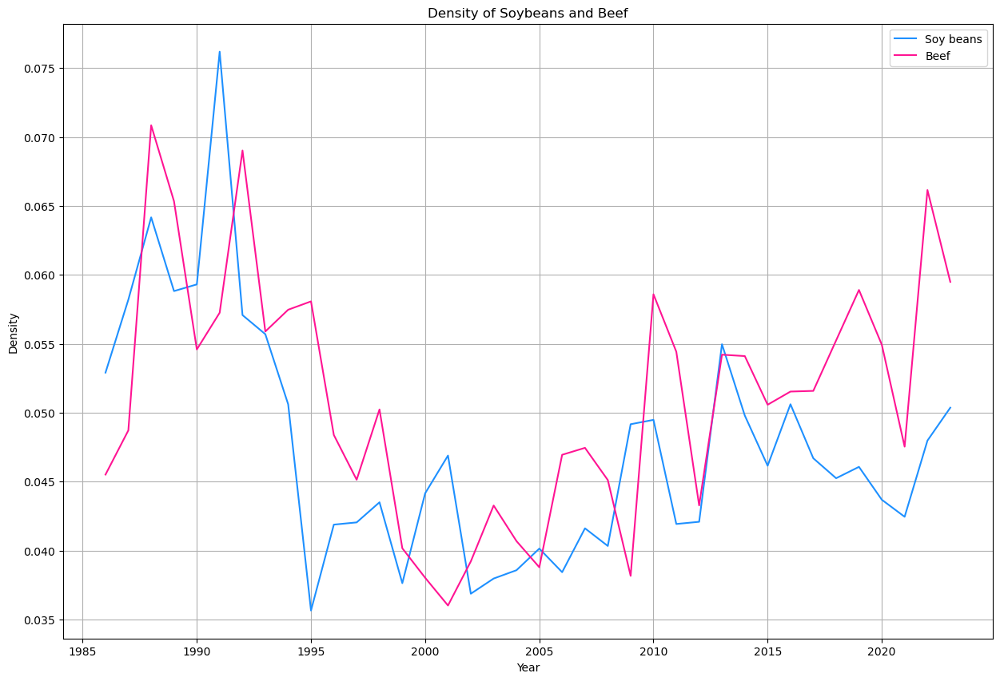

In [585]:
plt.figure(figsize=(15,10))
plt.plot(y1, densities_s, label = "Soy beans", color='dodgerblue')
plt.plot(y1, densities_b, label = "Beef", color='deeppink')
plt.title("Density of Soybeans and Beef")
plt.xlabel("Year")
plt.ylabel("Density")
plt.legend()
plt.grid(True)

### In Degree, Out Degree

In [549]:
edge

,O_code,O_name,D_code,D_name,year,item,weight
0,18,Bhutan,100,India,2010,Soy beans,39.00
1,18,Bhutan,100,India,2012,Soy beans,1.00
2,130,Malawi,20,Botswana,2014,Soy beans,2365.00
3,217,Togo,255,Belgium,2023,Soy beans,9298.05
4,120,Lao People's Democratic Republic,41,"China, mainland",2016,Soy beans,22.17
...,...,...,...,...,...,...,...
19457,150,Netherlands (Kingdom of the),231,United States of America,1997,Beef,11.00
19458,150,Netherlands (Kingdom of the),231,United States of America,2021,Beef,3.43
19459,150,Netherlands (Kingdom of the),231,United States of America,2022,Beef,3.75
19460,150,Netherlands (Kingdom of the),234,Uruguay,2023,Beef,17.83


In [551]:
y1 = []
for i in range(len(year)):
    
    y = i + min(year)
    edge_s = edge[edge["year"] == y]
    
    node_s = node_s.drop_duplicates(subset='country')
    node_s = node_s[node_s["year"] == y]
    node_attr = node_s.set_index('country').to_dict('index') 

    G = nx.from_pandas_edgelist(edge_s, source = 'O_name', target = 'D_name', 
                            edge_attr = 'weight', create_using = nx.DiGraph()
                           )

    
    nx.set_node_attributes(G, node_attr)

    out_degree_dict = dict(G.out_degree(weight='Value'))


    in_degree_dict = dict(G.in_degree(weight='Value'))
    out_degree_dict = dict(G.out_degree(weight='Value'))

    in_degree_dict = dict(G.in_degree(weight='Value'))
    
    nx.set_node_attributes(G, out_degree_dict, 'i_degree')
    nx.set_node_attributes(G, in_degree_dict, 'o_degree')

    sorted(out_degree_dict.items(), key=itemgetter(1), reverse=True)
    sorted(in_degree_dict.items(), key=itemgetter(1), reverse=True)

print(out_degree_dict)

{'Togo': 4, 'Belgium': 24, 'Canada': 23, 'Algeria': 0, 'Luxembourg': 9, 'Austria': 25, 'Bolivia (Plurinational State of)': 3, 'Argentina': 6, 'Paraguay': 5, 'Serbia': 18, 'China, mainland': 4, 'Burkina Faso': 1, "Côte d'Ivoire": 2, 'Uruguay': 4, 'Ukraine': 14, 'Ethiopia': 1, 'China, Taiwan Province of': 6, 'Australia': 7, 'Slovakia': 12, 'United Republic of Tanzania': 2, 'Romania': 22, 'Mozambique': 3, 'Malawi': 3, 'Croatia': 16, 'Kazakhstan': 5, 'Denmark': 20, 'Brazil': 4, 'China, Macao SAR': 1, 'China, Hong Kong SAR': 6, 'Ghana': 5, 'Slovenia': 11, 'Poland': 20, 'Bosnia and Herzegovina': 5, 'Zambia': 2, 'India': 4, 'Czechia': 20, 'United States of America': 22, 'Eswatini': 1, 'South Africa': 7, 'New Zealand': 6, 'Hungary': 15, 'Chile': 0, 'Sri Lanka': 2, 'Türkiye': 12, 'Sweden': 21, 'Switzerland': 8, 'United Arab Emirates': 13, 'Botswana': 3, 'Spain': 20, 'France': 36, 'Bulgaria': 13, 'Zimbabwe': 1, 'Estonia': 8, 'Finland': 5, 'Latvia': 8, 'Guyana': 2, 'Armenia': 1, 'Russian Federati

In [553]:
# Out-degree (edges going *out* of the node)
out_degree_dict = dict(G.out_degree(weight='weight'))

# In-degree (edges coming *into* the node)
in_degree_dict = dict(G.in_degree(weight='Value'))

In [555]:
nx.set_node_attributes(G, out_degree_dict, 'i_degree')
nx.set_node_attributes(G, in_degree_dict, 'o_degree')

In [557]:
sorted(out_degree_dict.items(), key=itemgetter(1), reverse=True)

[('United States of America', 31053585.990000002),
 ('China, mainland', 29335077.16),
 ('Argentina', 6388092.75),
 ('Paraguay', 6222362.25),
 ('Brazil', 4607914.899999999),
 ('Canada', 3747086.29),
 ('Spain', 1544461.8299999998),
 ('Ukraine', 1041603.01),
 ('Thailand', 443567.58999999997),
 ('Bolivia (Plurinational State of)', 371615.97000000003),
 ('Malaysia', 299019.57),
 ('Portugal', 265725.48),
 ('Costa Rica', 250611.88),
 ('United Kingdom of Great Britain and Northern Ireland', 240095.73),
 ('Germany', 219744.72),
 ('Italy', 191826.16),
 ('Uruguay', 190138.08),
 ('Türkiye', 181073.76),
 ('Poland', 178270.09999999998),
 ('Romania', 162246.08000000002),
 ('Belgium', 152898.16999999998),
 ('France', 138353.48),
 ('Netherlands (Kingdom of the)', 137906.26),
 ('Peru', 93060.90000000001),
 ('United Republic of Tanzania', 76937.48000000001),
 ('China, Taiwan Province of', 64985.19),
 ('Togo', 42152.17),
 ('Austria', 38123.58),
 ('Ireland', 37699.89),
 ('Zambia', 36865.92),
 ('Ghana', 261

In [559]:
sorted(in_degree_dict.items(), key=itemgetter(1), reverse=True)

[('United States of America', 35),
 ('France', 32),
 ('Germany', 31),
 ('Italy', 28),
 ('Poland', 24),
 ('Netherlands (Kingdom of the)', 24),
 ('Belgium', 23),
 ('Austria', 23),
 ('Czechia', 23),
 ('Spain', 23),
 ('Sweden', 22),
 ('United Kingdom of Great Britain and Northern Ireland', 22),
 ('Romania', 20),
 ('Denmark', 19),
 ('Ireland', 17),
 ('Serbia', 16),
 ('China, mainland', 16),
 ('Hungary', 15),
 ('Croatia', 14),
 ('Ukraine', 13),
 ('Slovakia', 13),
 ('Lithuania', 13),
 ('Canada', 12),
 ('Slovenia', 12),
 ('Greece', 12),
 ('China, Taiwan Province of', 11),
 ('Bulgaria', 11),
 ('Japan', 11),
 ('Estonia', 10),
 ('Latvia', 10),
 ('Republic of Korea', 10),
 ('Portugal', 9),
 ('Luxembourg', 8),
 ('Australia', 8),
 ('Chile', 8),
 ('Türkiye', 8),
 ('New Zealand', 7),
 ('Switzerland', 7),
 ('United Arab Emirates', 7),
 ('Philippines', 7),
 ('Argentina', 6),
 ('China, Hong Kong SAR', 6),
 ('South Africa', 6),
 ('Russian Federation', 6),
 ('Brazil', 5),
 ('India', 5),
 ('Malaysia', 5),
 

In [682]:
top_outdegree_per_year = {}
top_indegree_per_year = {}

for i in range(len(year)):
    y = i + min(year)
    
    edge_s = edge[edge["year"] == y]
    node_y = node_s[node_s["year"] == y].drop_duplicates(subset='country')
    node_attr = node_y.set_index('country').to_dict('index') 

    G = nx.from_pandas_edgelist(edge_s, source='O_name', target='D_name', 
                            edge_attr='weight', create_using=nx.DiGraph())

    out_degree_dict = dict(G.out_degree(weight='weight'))
    in_degree_dict = dict(G.in_degree(weight='weight'))


    nx.set_node_attributes(G, node_attr)

    out_degree_dict = dict(G.out_degree(weight='Value'))
    in_degree_dict = dict(G.in_degree(weight='Value'))

    nx.set_node_attributes(G, out_degree_dict, 'out_degree')
    nx.set_node_attributes(G, in_degree_dict, 'in_degree')

    top7_out = sorted(out_degree_dict.items(), key=itemgetter(1), reverse=True)[:7]
    top7_in = sorted(in_degree_dict.items(), key=itemgetter(1), reverse=True)[:7]

    top_outdegree_per_year[y] = top7_out
    top_indegree_per_year[y] = top7_in
    
    top_outdegree_per_year[y] = top_outdegree_per_year.get(y)
    top_indegree_per_year[y] = top_indegree_per_year.get(y)


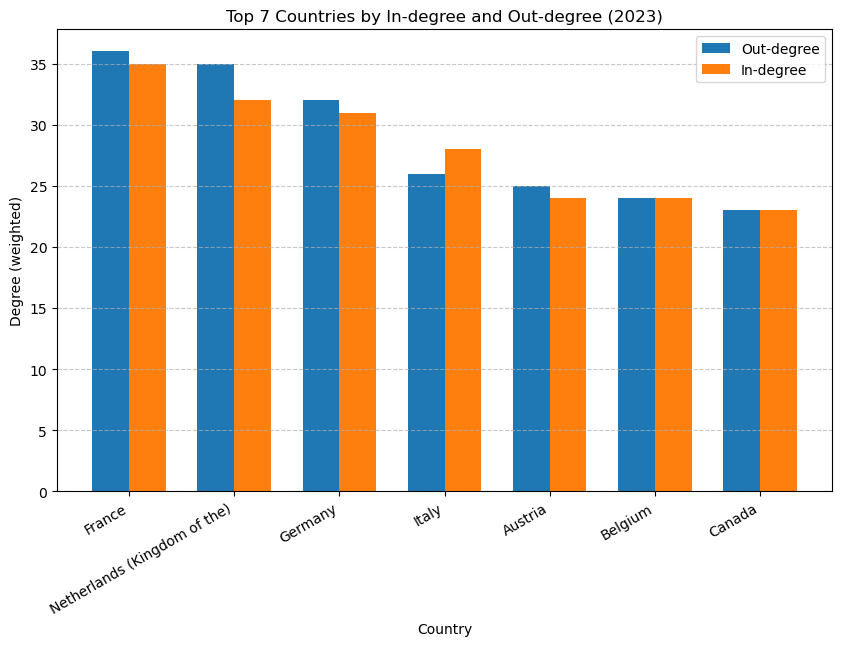

In [829]:
#Top 7 Out-degree (2023)
top7_out_2023 =  [('France', 36), 
                  ('Netherlands (Kingdom of the)', 35),
                  ('Germany', 32), 
                  ('Italy', 26), 
                  ('Austria', 25), 
                  ('Belgium', 24), 
                  ('Canada', 23)]

# Top 7 In-degree (2023)
top7_in_2023 =  [('United States of America', 35), 
                 ('France', 32), 
                 ('Germany', 31), 
                 ('Italy', 28), 
                 ('Poland', 24),
                 ('Netherlands (Kingdom of the)', 24), 
                 ('Belgium', 23)]


out_labels, out_values = zip(*top7_out_2023)
in_labels, in_values = zip(*top7_in_2023)

# Plot
plt.figure(figsize=(10, 6))
bar_width = 0.35
x = range(len(out_labels))


plt.bar(x, out_values, width=bar_width, label='Out-degree', align='center')
plt.bar([p + bar_width for p in x], in_values, width=bar_width, label='In-degree', align='center')


plt.xlabel('Country')
plt.ylabel('Degree (weighted)')
plt.title('Top 7 Countries by In-degree and Out-degree (2023)')
plt.xticks([p + bar_width / 2 for p in x], out_labels, rotation=30, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


In [831]:
# Time series....................................................로 해보았습니다 교수님...
from collections import Counter

def get_top_n_countries(top_dict, n=7):
    counter = Counter()
    for year in top_dict:
        countries = [country for country, _ in top_dict[year]]
        counter.update(countries)
    return [country for country, _ in counter.most_common(n)]


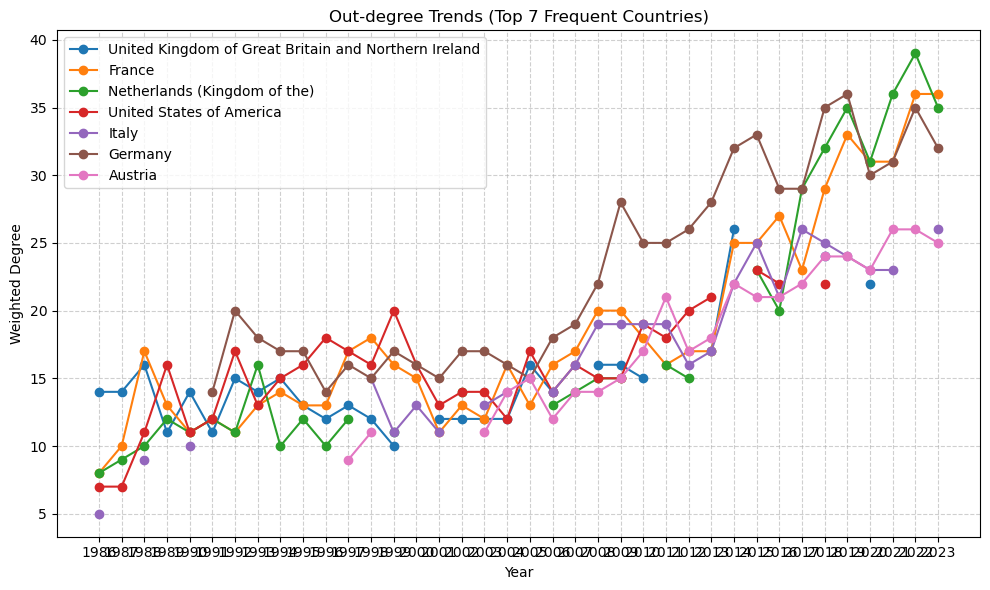

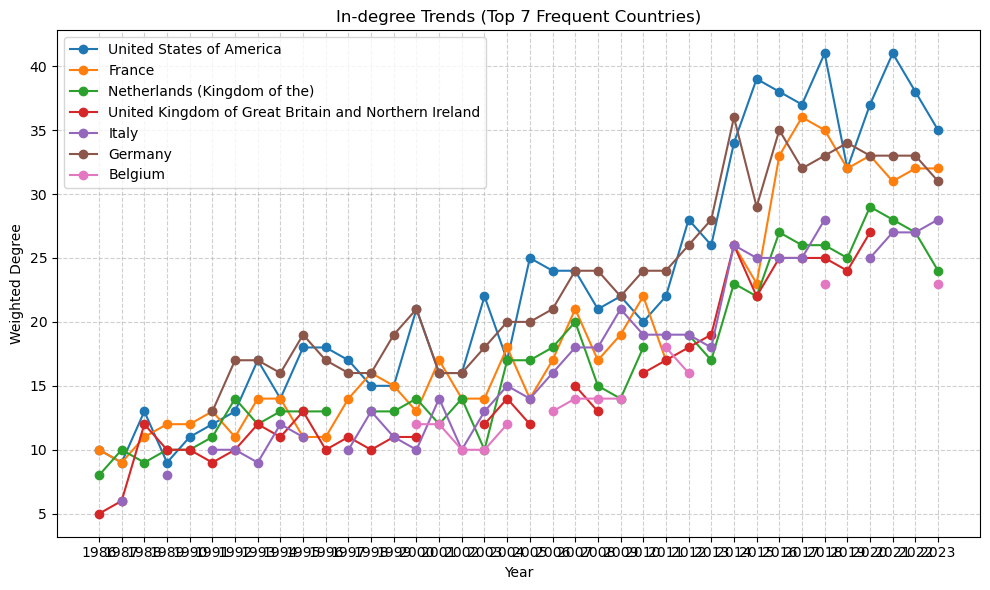

In [833]:
def filter_degree_dict(degree_dict, top_countries):
    return {country: values for country, values in degree_dict.items() if country in top_countries}
    
# Step 1: 전체에서 top 7 빈도 높은 국가 추출
top7_out_countries = get_top_n_countries(top_outdegree_per_year, n=7)
top7_in_countries = get_top_n_countries(top_indegree_per_year, n=7)

# Step 2: 시계열 변환
out_series_dict, years = convert_top_dict_to_series(top_outdegree_per_year)
in_series_dict, _ = convert_top_dict_to_series(top_indegree_per_year)

# Step 3: 필요한 나라만 필터링
out_series_dict_filtered = filter_degree_dict(out_series_dict, top7_out_countries)
in_series_dict_filtered = filter_degree_dict(in_series_dict, top7_in_countries)

# Step 4: 시각화
plot_degree_trends(out_series_dict_filtered, years, "Out-degree Trends (Top 7 Frequent Countries)")
plot_degree_trends(in_series_dict_filtered, years, "In-degree Trends (Top 7 Frequent Countries)")


### Visualization

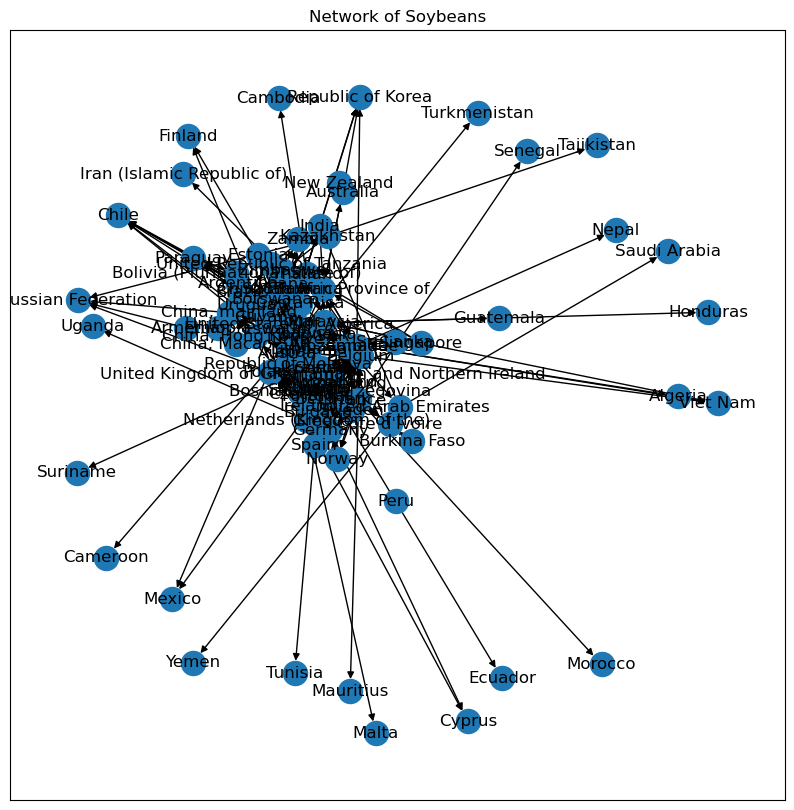

In [315]:
plt.figure(figsize = (10,10))
plt.title("Network of Soybeans")
nx.draw_networkx(G_s, with_labels=True)
plt.show()

In [410]:
betweenness_dict_s = nx.betweenness_centrality(G_s) # Run betweenness centrality
eigenvector_dict_s = nx.eigenvector_centrality(G_s) # Run eigenvector centrality: How influential a node is in a network.

# Assign each to an attribute in your network
nx.set_node_attributes(G_s, betweenness_dict_s, 'betweenness_soybean')
nx.set_node_attributes(G_s, eigenvector_dict_s, 'eigenvector_soybean')

In [412]:
communities_s = community.greedy_modularity_communities(G_s)

modularity_dict_s = {} # Create a blank dictionary
for i,c in enumerate(communities_s): # Loop through the list of communities
    for name in c: # Loop through each person in a community
        modularity_dict_s[name] = i # Create an entry in the dictionary for the person

print(modularity_dict_s)

{'Malaysia': 0, 'Canada': 0, 'China, Hong Kong SAR': 0, 'Algeria': 0, 'Iran (Islamic Republic of)': 0, 'India': 0, 'Singapore': 0, 'Turkmenistan': 0, 'Indonesia': 0, 'Republic of Korea': 0, 'United States of America': 0, 'Guyana': 0, 'Viet Nam': 0, 'Ethiopia': 0, 'Suriname': 0, 'Guatemala': 0, 'Argentina': 0, 'Ecuador': 0, 'New Zealand': 0, 'China, Macao SAR': 0, 'Bolivia (Plurinational State of)': 0, 'Costa Rica': 0, 'Uruguay': 0, 'Japan': 0, 'Paraguay': 0, 'China, mainland': 0, 'Peru': 0, 'Cameroon': 0, 'Thailand': 0, 'Mexico': 0, 'Ghana': 0, 'United Republic of Tanzania': 0, 'Cambodia': 0, 'Brazil': 0, 'Türkiye': 0, 'Sri Lanka': 0, 'Honduras': 0, 'Togo': 0, 'Chile': 0, 'China, Taiwan Province of': 0, 'Australia': 0, 'Nepal': 0, 'Czechia': 1, 'Serbia': 1, 'Malta': 1, 'Romania': 1, 'Slovakia': 1, 'Hungary': 1, 'Slovenia': 1, 'Italy': 1, 'Netherlands (Kingdom of the)': 1, 'Switzerland': 1, 'Bulgaria': 1, 'Austria': 1, 'Cyprus': 1, 'Uganda': 1, 'Greece': 1, 'Republic of Moldova': 1, 'Po

In [414]:
nx.set_node_attributes(G_s, modularity_dict_s, 'modularity_soybean')

C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\2351805145.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes


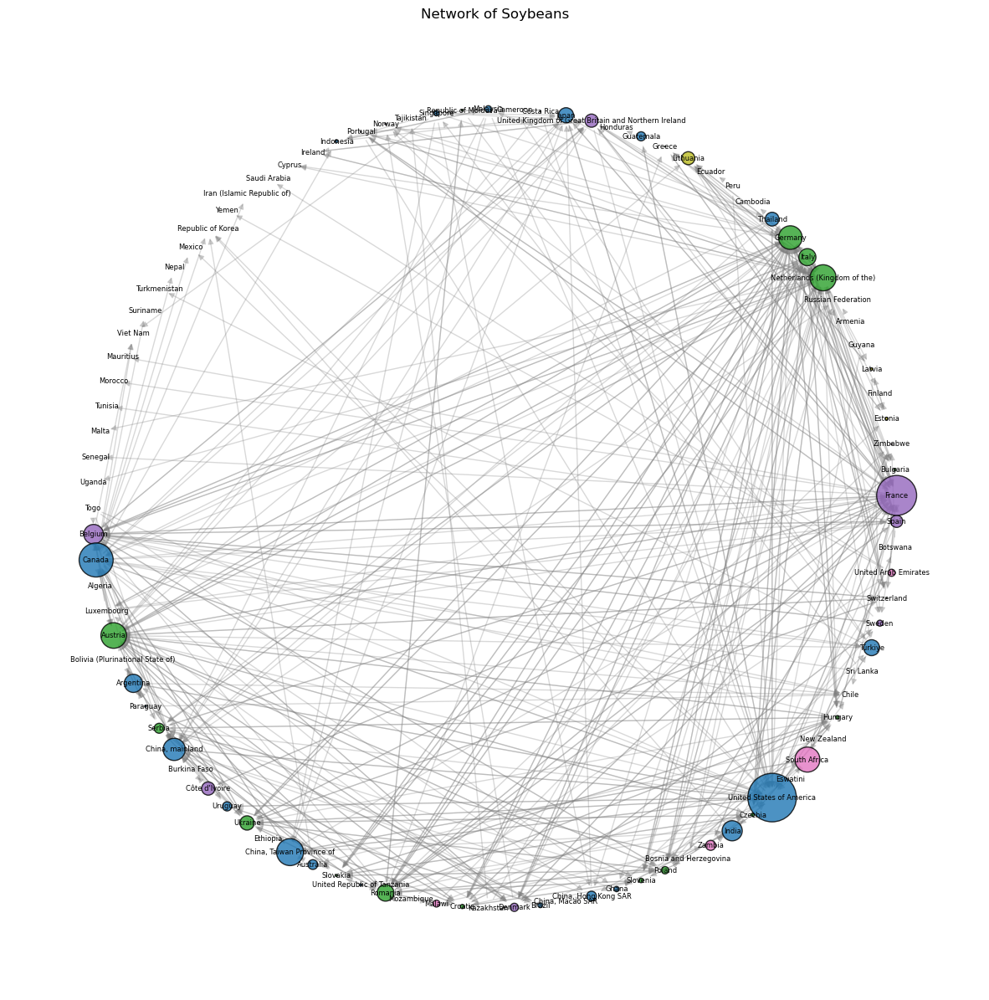

In [416]:
# Extract node attributes #pop macro 활용해서 그룹화해서 색깔 지정
node_sizes = [8000 * G_s.nodes[node]['betweenness_soybean'] for node in G_s.nodes()]  # Scale betweenness
node_colors = [G_s.nodes[node]['modularity_soybean'] for node in G_s.nodes()]  # Modularity-based color

# Define colormap for modularity
cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes

# Draw the network
plt.figure(figsize=(15, 15))
pos = nx.shell_layout(G_s)  # Use a force-directed layout for better visualization

# Draw nodes with size and color
nx.draw_networkx_nodes(G_s, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       cmap=cmap, 
                       alpha=0.8, 
                       edgecolors='black')

# Draw edges
nx.draw_networkx_edges(G_s, pos, alpha=0.3, edge_color='gray')

# Draw labels
nx.draw_networkx_labels(G_s, pos, font_size=6)


# Show the plot
plt.axis("off")
plt.title("Network of Soybeans")
plt.show()

C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\57362207.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes


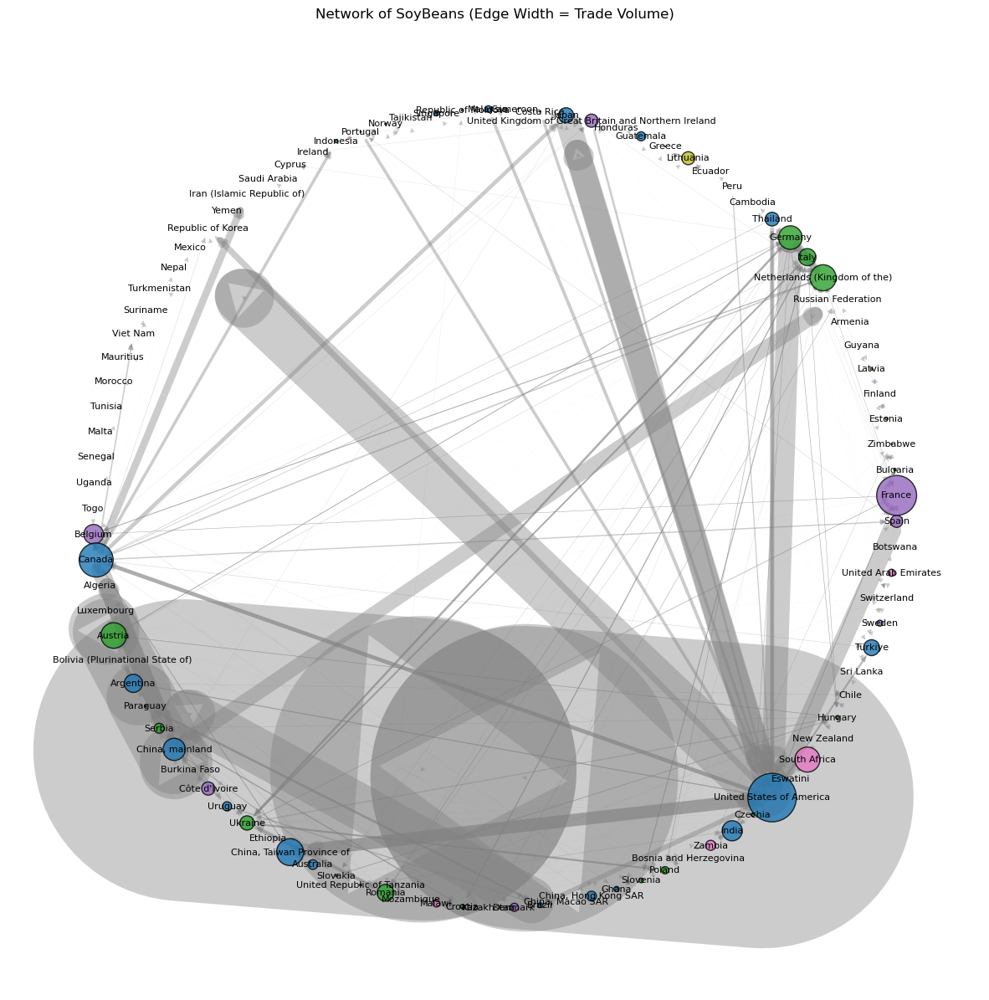

In [442]:
# Extract node attributes
node_sizes = [8000 * G_s.nodes[node]['betweenness_soybean'] for node in G_s.nodes()]  # Scale betweenness
node_colors = [G_s.nodes[node]['modularity_soybean'] for node in G_s.nodes()]  # Modularity-based color

# Define colormap for modularity
cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes

# Edge weight (두께): Final Value 기준으로 조정
edge_weights = [G_s[u][v]['Final Value'] * 0.0000098 for u, v in G_s.edges()]  # 값 작으면 0.01로 올려도 됨

# Draw the network
plt.figure(figsize=(15, 15))
pos = nx.shell_layout(G_s)  # 원형 레이아웃

# Draw nodes with size and color
nx.draw_networkx_nodes(G_s, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       cmap=cmap, 
                       alpha=0.8, 
                       edgecolors='black')

# Draw edges with custom width
nx.draw_networkx_edges(G_s, pos,
                       width=edge_weights,
                       alpha=0.4,
                       edge_color='gray')

# Draw labels
nx.draw_networkx_labels(G_s, pos, font_size=8)

# Show the plot
plt.axis("off")
plt.title("Network of SoyBeans (Edge Width = Trade Volume)")
plt.show()


In [448]:
node.head()

,country,country_code,year,GDP,Population
0,Afghanistan,2,1970,16.015601,11290.128
1,Afghanistan,2,1971,17.130539,11567.667
2,Afghanistan,2,1972,17.929952,11853.696
3,Afghanistan,2,1973,17.425341,12157.999
4,Afghanistan,2,1974,21.245487,12469.127


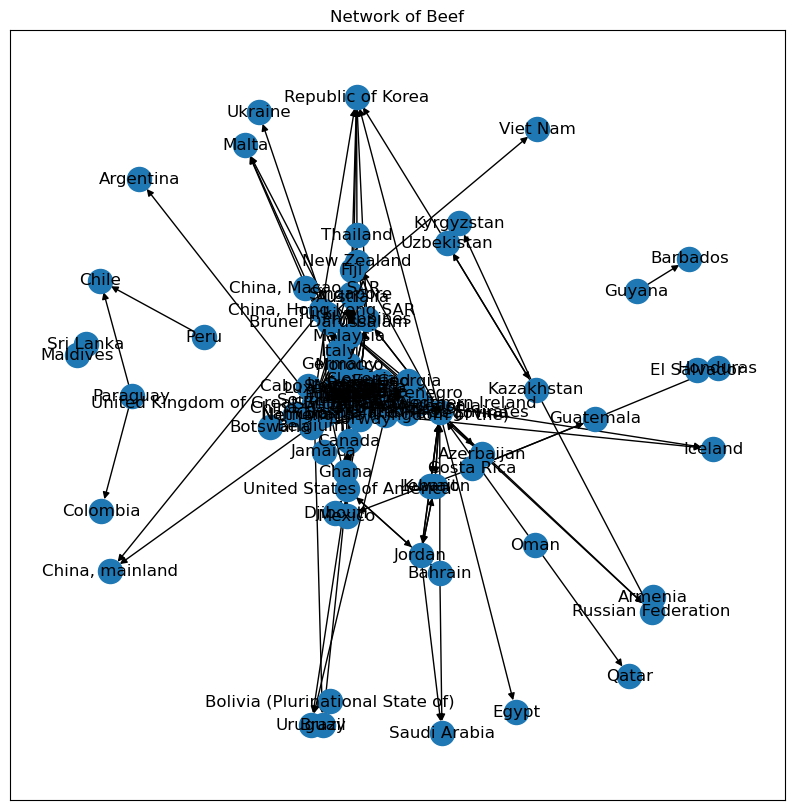

In [611]:
plt.figure(figsize = (10,10))
plt.title("Network of Beef")
nx.draw_networkx(G_b, with_labels=True)
plt.show()

In [615]:
betweenness_dict = nx.betweenness_centrality(G_b) # Run betweenness centrality
eigenvector_dict = nx.eigenvector_centrality(G_b) # Run eigenvector centrality: How influential a node is in a network.

# Assign each to an attribute in your network
nx.set_node_attributes(G_b, betweenness_dict, 'betweenness')
nx.set_node_attributes(G_b, eigenvector_dict, 'eigenvector')

In [617]:
communities = community.greedy_modularity_communities(G_b)

modularity_dict = {} # Create a blank dictionary
for i,c in enumerate(communities): # Loop through the list of communities
    for name in c: # Loop through each person in a community
        modularity_dict[name] = i # Create an entry in the dictionary for the person

print(modularity_dict)

{'Malaysia': 0, 'Canada': 0, 'China, Hong Kong SAR': 0, 'Singapore': 0, 'Qatar': 0, 'Indonesia': 0, 'Republic of Korea': 0, 'Jamaica': 0, 'United States of America': 0, 'Viet Nam': 0, 'South Africa': 0, 'New Zealand': 0, 'China, Macao SAR': 0, 'Saudi Arabia': 0, 'Bolivia (Plurinational State of)': 0, 'Jordan': 0, 'Uruguay': 0, 'Japan': 0, 'China, mainland': 0, 'United Arab Emirates': 0, 'Kuwait': 0, 'Mozambique': 0, 'Lebanon': 0, 'Thailand': 0, 'Mexico': 0, 'Ghana': 0, 'Fiji': 0, 'Brazil': 0, 'Oman': 0, 'Brunei Darussalam': 0, 'Philippines': 0, 'Bahrain': 0, 'China, Taiwan Province of': 0, 'Djibouti': 0, 'Australia': 0, 'Egypt': 0, 'Czechia': 1, 'Romania': 1, 'Malta': 1, 'Slovakia': 1, 'Portugal': 1, 'Italy': 1, 'Finland': 1, 'Denmark': 1, 'Spain': 1, 'Estonia': 1, 'Argentina': 1, 'Lithuania': 1, 'United Kingdom of Great Britain and Northern Ireland': 1, 'Norway': 1, 'Luxembourg': 1, 'Poland': 1, 'Ireland': 1, 'Iceland': 1, 'Belgium': 1, 'Hungary': 1, 'Slovenia': 1, 'Sweden': 1, 'Nethe

In [619]:
nx.set_node_attributes(G_b, modularity_dict, 'modularity')

C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\3455184432.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes


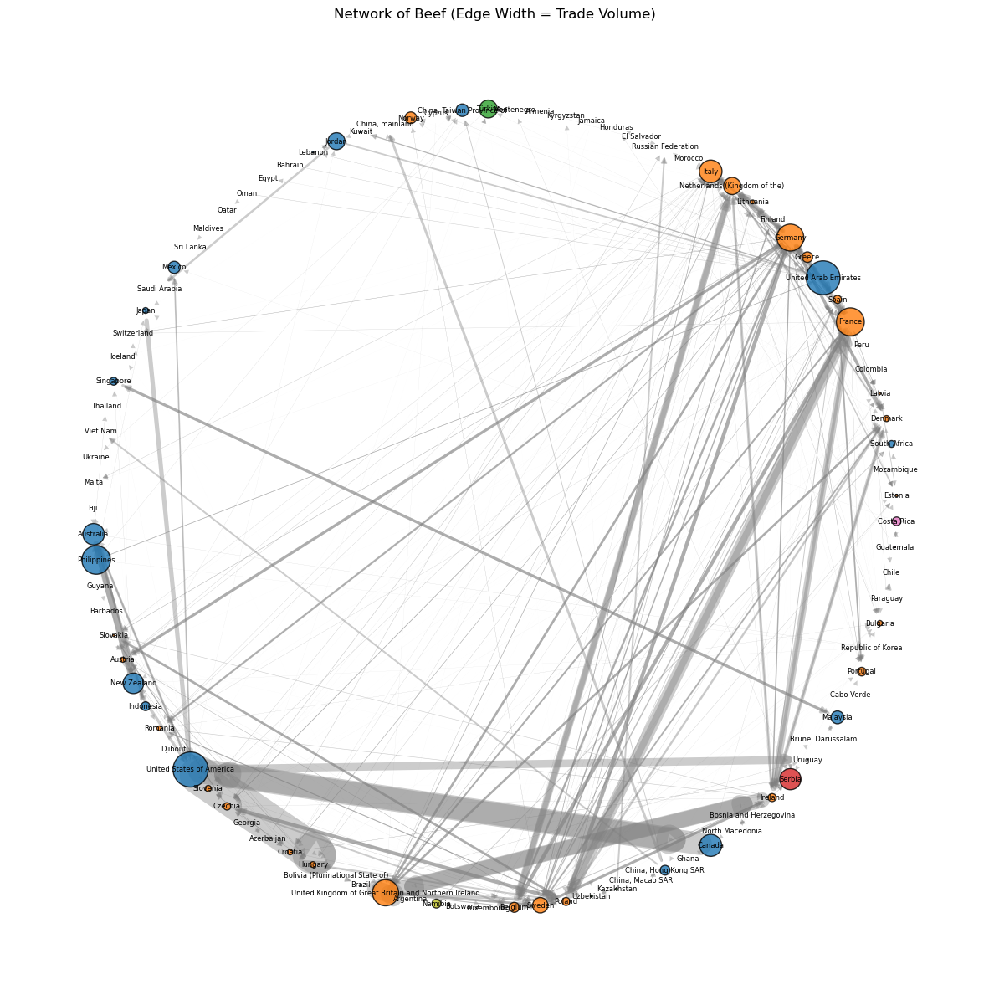

In [627]:
# Extract node attributes
node_sizes = [8000 * G_b.nodes[node]['betweenness'] for node in G_b.nodes()]  # Scale betweenness
node_colors = [G_b.nodes[node]['modularity'] for node in G_b.nodes()]  # Modularity-based color

# Define colormap for modularity
cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes

# Edge weight (두께): Final Value 기준으로 조정
edge_weights = [G_b[u][v]['Final Value'] * 0.0008 for u, v in G_b.edges()]  # 값 작으면 0.01로 올려도 됨

# Draw the network
plt.figure(figsize=(15, 15))
pos = nx.shell_layout(G_b)  # 원형 레이아웃

# Draw nodes with size and color
nx.draw_networkx_nodes(G_b, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       cmap=cmap, 
                       alpha=0.8, 
                       edgecolors='black')

# Draw edges with custom width
nx.draw_networkx_edges(G_b, pos,
                       width=edge_weights,
                       alpha=0.4,
                       edge_color='gray')

# Draw labels
nx.draw_networkx_labels(G_b, pos, font_size=6)

# Show the plot
plt.axis("off")
plt.title("Network of Beef (Edge Width = Trade Volume)")
plt.show()


In [587]:
betweenness_dict = nx.betweenness_centrality(G) # Run betweenness centrality
eigenvector_dict = nx.eigenvector_centrality(G) # Run eigenvector centrality: How influential a node is in a network.

# Assign each to an attribute in your network
nx.set_node_attributes(G, betweenness_dict, 'betweenness')
nx.set_node_attributes(G, eigenvector_dict, 'eigenvector')

In [589]:
communities = community.greedy_modularity_communities(G)

modularity_dict = {} # Create a blank dictionary
for i,c in enumerate(communities): # Loop through the list of communities
    for name in c: # Loop through each person in a community
        modularity_dict[name] = i # Create an entry in the dictionary for the person

print(modularity_dict)

{'Malaysia': 0, 'Canada': 0, 'China, Hong Kong SAR': 0, 'Algeria': 0, 'Iran (Islamic Republic of)': 0, 'India': 0, 'Singapore': 0, 'Indonesia': 0, 'Republic of Korea': 0, 'Jamaica': 0, 'United States of America': 0, 'Guyana': 0, 'Viet Nam': 0, 'Ethiopia': 0, 'Suriname': 0, 'Guatemala': 0, 'Argentina': 0, 'Ecuador': 0, 'New Zealand': 0, 'China, Macao SAR': 0, 'Maldives': 0, 'Bolivia (Plurinational State of)': 0, 'Costa Rica': 0, 'Uruguay': 0, 'Japan': 0, 'Paraguay': 0, 'China, mainland': 0, 'Peru': 0, 'Thailand': 0, 'Mexico': 0, 'Ghana': 0, 'United Republic of Tanzania': 0, 'Cambodia': 0, 'Fiji': 0, 'Brazil': 0, 'El Salvador': 0, 'Barbados': 0, 'Colombia': 0, 'Sri Lanka': 0, 'Brunei Darussalam': 0, 'Honduras': 0, 'Philippines': 0, 'Togo': 0, 'Chile': 0, 'China, Taiwan Province of': 0, 'Djibouti': 0, 'Australia': 0, 'Nepal': 0, 'Czechia': 1, 'Romania': 1, 'Montenegro': 1, 'Malta': 1, 'Slovakia': 1, 'Mauritius': 1, 'Portugal': 1, 'Italy': 1, 'Finland': 1, 'Senegal': 1, 'Tunisia': 1, 'Denm

In [591]:
nx.set_node_attributes(G, modularity_dict, 'modularity')

C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\172121933.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes


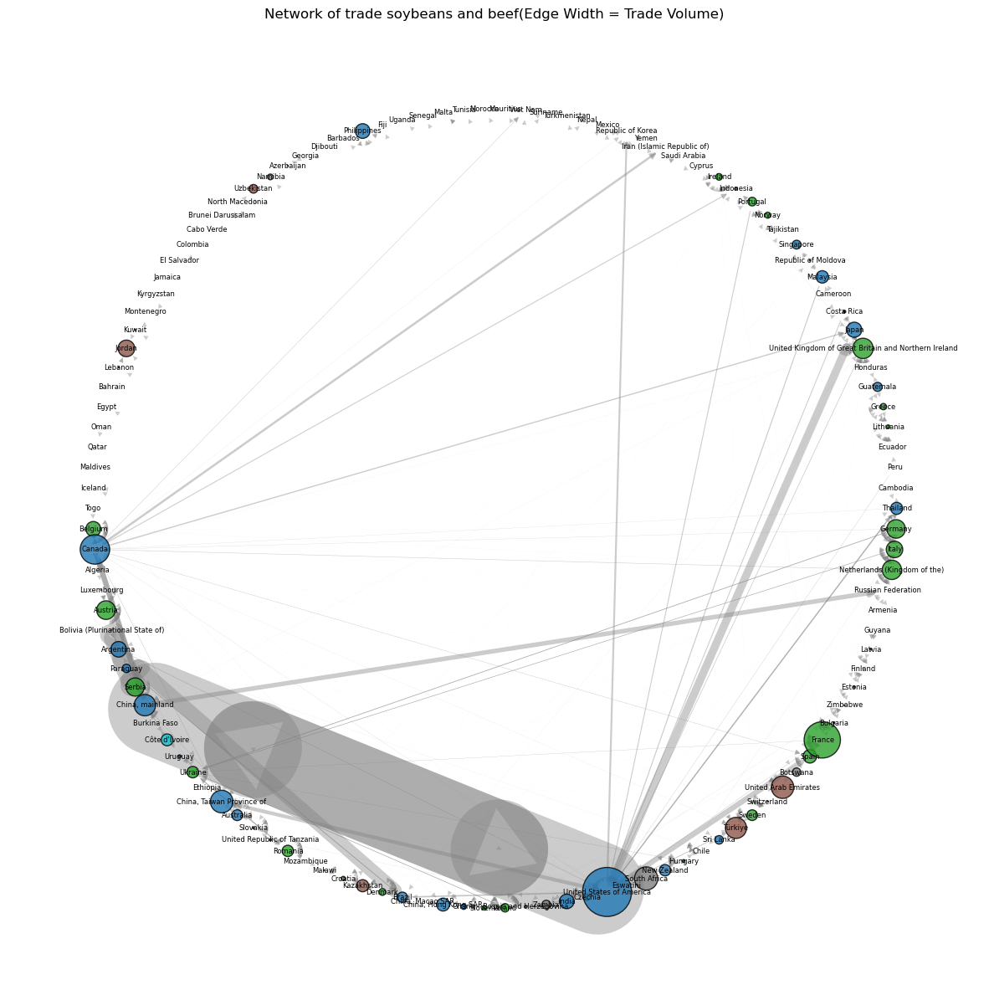

In [609]:
# Extract node attributes
node_sizes = [8000 * G.nodes[node]['betweenness'] for node in G.nodes()]  # Scale betweenness
node_colors = [G.nodes[node]['modularity'] for node in G.nodes()]  # Modularity-based color

# Define colormap for modularity
cmap = plt.cm.get_cmap('tab10', max(node_colors) + 1)  # Adjust based on modularity classes

# Edge weight (두께): Final Value 기준으로 조정
edge_weights = [G[u][v]['weight'] * 0.000003 for u, v in G.edges()]  # 값 작으면 0.01로 올려도 됨

# Draw the network
plt.figure(figsize=(15, 15))
pos = nx.shell_layout(G)  # 원형 레이아웃

# Draw nodes with size and color
nx.draw_networkx_nodes(G, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       cmap=cmap, 
                       alpha=0.8, 
                       edgecolors='black')

# Draw edges with custom width
nx.draw_networkx_edges(G, pos,
                       width=edge_weights,
                       alpha=0.4,
                       edge_color='gray')

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=6)

# Show the plot
plt.axis("off")
plt.title("Network of trade soybeans and beef(Edge Width = Trade Volume)")
plt.show()


# Flow visualization on map

In [699]:
import plotly.graph_objects as go

df_airports = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
print(df_airports.head())

df_flight_paths = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_aa_flight_paths.csv')
print(df_flight_paths.head())

  iata                            airport               city state country  \
0  ORD       Chicago O'Hare International            Chicago    IL     USA   
1  ATL  William B Hartsfield-Atlanta Intl            Atlanta    GA     USA   
2  DFW    Dallas-Fort Worth International  Dallas-Fort Worth    TX     USA   
3  PHX   Phoenix Sky Harbor International            Phoenix    AZ     USA   
4  DEN                        Denver Intl             Denver    CO     USA   

         lat        long    cnt  
0  41.979595  -87.904464  25129  
1  33.640444  -84.426944  21925  
2  32.895951  -97.037200  20662  
3  33.434167 -112.008056  17290  
4  39.858408 -104.667002  13781  
   start_lat  start_lon    end_lat     end_lon airline airport1 airport2  cnt
0  32.895951 -97.037200  35.040222 -106.609194      AA      DFW      ABQ  444
1  41.979595 -87.904464  30.194533  -97.669872      AA      ORD      AUS  166
2  32.895951 -97.037200  41.938874  -72.683228      AA      DFW      BDL  162
3  18.439417 -6

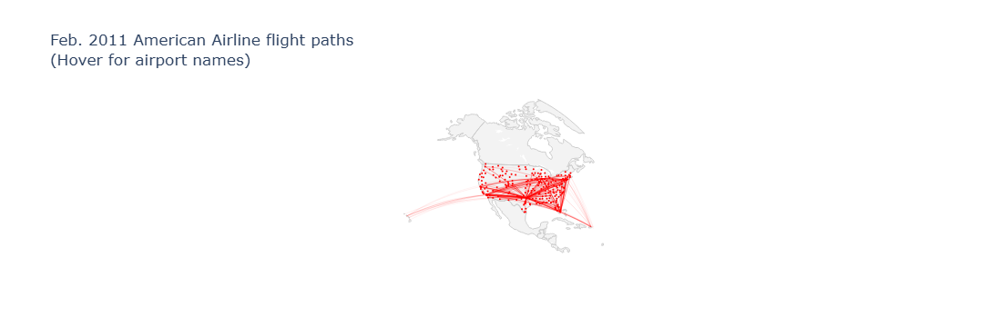

In [701]:
fig = go.Figure()

fig.add_trace(go.Scattergeo(
    locationmode = 'USA-states',
    lon = df_airports['long'],
    lat = df_airports['lat'],
    hoverinfo = 'text',
    text = df_airports['airport'],
    mode = 'markers',
    marker = dict(
        size = 2,
        color = 'rgb(255, 0, 0)',
        line = dict(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    )))

flight_paths = []
for i in range(len(df_flight_paths)):
    fig.add_trace(
        go.Scattergeo(
            locationmode = 'USA-states',
            lon = [df_flight_paths['start_lon'][i], df_flight_paths['end_lon'][i]],
            lat = [df_flight_paths['start_lat'][i], df_flight_paths['end_lat'][i]],
            mode = 'lines',
            line = dict(width = 1,color = 'red'),
            opacity = float(df_flight_paths['cnt'][i]) / float(df_flight_paths['cnt'].max()),
        )
    )

fig.update_layout(
    title_text = 'Feb. 2011 American Airline flight paths<br>(Hover for airport names)',
    showlegend = False,
    geo = dict(
        scope = 'north america',
        projection_type = 'azimuthal equal area',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
    ),
)

fig.show()

In [707]:
import geopandas as gpd

# (1) Read shp file --- polygon file
gdf = gpd.read_file("world_countries_new.shp") 

# (2) Get centroids of countries
gdf['centroid'] = gdf.geometry.centroid

# (3) Get lon and lat
gdf['lon'] = gdf.centroid.x
gdf['lat'] = gdf.centroid.y

# (4) Select columns
gdf = gdf[['Area','Area_Cd','lon', 'lat']].copy()
gdf = gdf.dropna(subset=['Area_Cd'])


gdf

C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\3319270481.py:7: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\3319270481.py:10: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\JuhyunN\AppData\Local\Temp\ipykernel_13180\3319270481.py:11: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




,Area,Area_Cd,lon,lat
1,Guyana,91.0,-58.974781,4.792017
4,Suriname,207.0,-55.911827,4.126394
5,Trinidad and Tobago,220.0,-61.253172,10.468645
6,Venezuela (Bolivarian Republic of),236.0,-66.169564,7.122449
11,Samoa,244.0,-172.159459,-13.758367
...,...,...,...,...
223,"China, Taiwan Province of",214.0,120.968186,23.747486
224,"China, Hong Kong SAR",96.0,114.134965,22.381121
225,"China, Macao SAR",128.0,113.559255,22.160367
226,Sudan,276.0,29.953612,15.994194


### Convert the node info of network to a dataframe

In [710]:
node_data = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')

# Have node IDs as a column
node_data.reset_index(inplace=True)
node_data.rename(columns={'index': 'node'}, inplace=True)
node_data

,node,out_degree,in_degree
0,Togo,4,0
1,Belgium,24,23
2,Canada,23,12
3,Algeria,0,1
4,Luxembourg,9,8
...,...,...,...
117,Egypt,0,1
118,Oman,2,0
119,Qatar,0,1
120,Maldives,1,0


In [742]:
merged_node = pd.merge(
    node_data.assign(node=node_data['node'].astype(str)),
    gdf.assign(Area_Cd=gdf['Area_Cd'].astype(str)),
    left_on='node',
    right_on='Area_Cd',
    how='left'
)

In [744]:
edge_data = pd.DataFrame([
    {'source': u,'target': v, **data}
    for u, v, data in G.edges(data=True)
])
edge_data

,source,target,weight
0,Togo,Belgium,9298.05
1,Togo,"China, mainland",965.42
2,Togo,Ghana,20000.00
3,Togo,United States of America,11888.70
4,Belgium,Austria,53.55
...,...,...,...
785,Bahrain,Saudi Arabia,6.92
786,Bahrain,United Arab Emirates,390.42
787,Oman,Qatar,25.82
788,Oman,United Arab Emirates,439.38


In [746]:
merged_edge = pd.merge(
    edge_data, gdf,
    left_on=['source'],
    right_on=['Area'],
    how='inner'  # or 'left', 'right', 'outer'
)

merged_edge = merged_edge.drop(columns=['Area', 'Area_Cd'])
merged_edge = merged_edge.rename(columns={
    'lon': 'start_lon',
    'lat': 'start_lat'
})
merged_edge

,source,target,weight,start_lon,start_lat
0,Togo,Belgium,9298.05,0.975721,8.534961
1,Togo,"China, mainland",965.42,0.975721,8.534961
2,Togo,Ghana,20000.00,0.975721,8.534961
3,Togo,United States of America,11888.70,0.975721,8.534961
4,Belgium,Austria,53.55,4.663987,50.642852
...,...,...,...,...,...
716,Bahrain,Saudi Arabia,6.92,50.559645,26.022406
717,Bahrain,United Arab Emirates,390.42,50.559645,26.022406
718,Oman,Qatar,25.82,56.109840,20.602286
719,Oman,United Arab Emirates,439.38,56.109840,20.602286


### Merge 'target' info with the centroid

In [761]:
merged_edge = pd.merge(
    merged_edge, gdf,
    left_on=['target'],
    right_on=['Area'],
    how='inner'  # or 'left', 'right', 'outer'
)

merged_edge = merged_edge.drop(columns=['Area', 'Area_Cd'])
merged_edge = merged_edge.rename(columns={
    'lon': 'end_lon',
    'lat': 'end_lat'
})
merged_edge

,source,target,weight,start_lon,start_lat,end_lon,end_lat,end_lon,end_lat
0,Togo,Belgium,9298.05,0.975721,8.534961,4.663987,50.642852,4.663987,50.642852
1,Togo,"China, mainland",965.42,0.975721,8.534961,103.809684,36.621082,103.809684,36.621082
2,Togo,Ghana,20000.00,0.975721,8.534961,-1.207301,7.959848,-1.207301,7.959848
3,Togo,United States of America,11888.70,0.975721,8.534961,-112.491510,45.695577,-112.491510,45.695577
4,Belgium,Austria,53.55,4.663987,50.642852,14.140191,47.592903,14.140191,47.592903
...,...,...,...,...,...,...,...,...,...
666,Bahrain,Saudi Arabia,6.92,50.559645,26.022406,44.546246,24.123000,44.546246,24.123000
667,Bahrain,United Arab Emirates,390.42,50.559645,26.022406,54.335155,23.910933,54.335155,23.910933
668,Oman,Qatar,25.82,56.109840,20.602286,51.191201,25.315079,51.191201,25.315079
669,Oman,United Arab Emirates,439.38,56.109840,20.602286,54.335155,23.910933,54.335155,23.910933


## Visualization

### Subset the link based on the value

In [765]:
merged_edge_s = merged_edge[merged_edge['weight'] > 50].reset_index(drop=True)
merged_edge_s

,source,target,weight,start_lon,start_lat,end_lon,end_lat,end_lon,end_lat
0,Togo,Belgium,9298.05,0.975721,8.534961,4.663987,50.642852,4.663987,50.642852
1,Togo,"China, mainland",965.42,0.975721,8.534961,103.809684,36.621082,103.809684,36.621082
2,Togo,Ghana,20000.00,0.975721,8.534961,-1.207301,7.959848,-1.207301,7.959848
3,Togo,United States of America,11888.70,0.975721,8.534961,-112.491510,45.695577,-112.491510,45.695577
4,Belgium,Austria,53.55,4.663987,50.642852,14.140191,47.592903,14.140191,47.592903
...,...,...,...,...,...,...,...,...,...
437,Jordan,United States of America,79.42,36.786730,31.253316,-112.491510,45.695577,-112.491510,45.695577
438,Lebanon,Jordan,276.24,35.888027,33.920266,36.786730,31.253316,36.786730,31.253316
439,Lebanon,United Arab Emirates,214.52,35.888027,33.920266,54.335155,23.910933,54.335155,23.910933
440,Bahrain,United Arab Emirates,390.42,50.559645,26.022406,54.335155,23.910933,54.335155,23.910933


In [821]:
edge_with_start = edge_s.merge(
    merged_node[['node', 'lon', 'lat']],
    left_on='O_name', right_on='node',
    how='left'
).rename(columns={'lon': 'start_lon', 'lat': 'start_lat'}).drop(columns='node')

merged_edge_s = edge_with_start.merge(
    merged_node[['node', 'lon', 'lat']],
    left_on='D_name', right_on='node',
    how='left'
).rename(columns={'lon': 'end_lon', 'lat': 'end_lat'}).drop(columns='node')


In [823]:
merged_edge_s = merged_edge_s.dropna(subset=['start_lon', 'start_lat', 'end_lon', 'end_lat'])

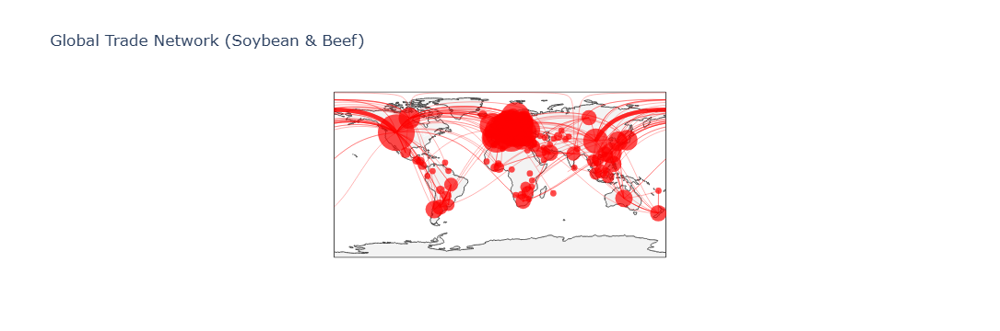

In [827]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scattergeo(
    lon = merged_node['lon'],
    lat = merged_node['lat'],
    text = merged_node['node'],
    mode = 'markers',
    marker = dict(
        size = merged_node['in_degree'],
        sizemode = 'area',
        sizeref = 2.*max(merged_node['in_degree'])/(40.**2),
        sizemin = 2,
        color = 'rgb(255, 0, 0)',
        line = dict(width=3, color='rgba(68, 68, 68, 0)')
    )
))

max_value = merged_edge_s['weight'].max()

for _, row in merged_edge_s.iterrows():
    fig.add_trace(go.Scattergeo(
        lon = [row['start_lon'], row['end_lon']],
        lat = [row['start_lat'], row['end_lat']],
        mode = 'lines',
        line = dict(
            width = 0.5 + 4 * (row['weight'] / max_value),
            color = 'red'
        ),
        opacity = 0.6,
    ))

fig.update_layout(
    title_text='Global Trade Network (Soybean & Beef)',
    showlegend=False,
    geo=dict(
        scope='world',
        projection_type='equirectangular',
        showland=True,
        landcolor='rgb(243, 243, 243)',
        countrycolor='rgb(204, 204, 204)',
    )
)

fig.show()